In [110]:
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import matplotlib.pyplot as plt

from data import setup_noise_schedule, cosine_beta_schedule, create_batch
from model import NoisePredictionMLP, sample_ddim, vector_field_ddim
from matplotlib.animation import FuncAnimation

In [111]:
#load model
state_dict = torch.load("diff_model_square.pth")
model = NoisePredictionMLP()
model.load_state_dict(state_dict)

C:\Users\archi\AppData\Local\Temp\ipykernel_34664\2363253921.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load("diff_model_square.pth")


<All keys matched successfully>

In [112]:
alpha_bars, betas = setup_noise_schedule(1000)

In [113]:
#visualize distribution
def plot_points(x, y):
    """
    Plots the generated 2D points.
    """
    # Increased point size for clearer visibility of the sharp points
    plt.figure(figsize=(7, 7))
    plt.scatter(x, y, s=20, alpha=0.9, color='indigo') 
    plt.title('2D Distribution')
    plt.xlabel('X Coordinate')
    plt.ylabel('Y Coordinate')
    plt.gca().set_aspect('equal', adjustable='box') # Ensure circle looks like a circle
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

DDIM Sampling with 100 steps...


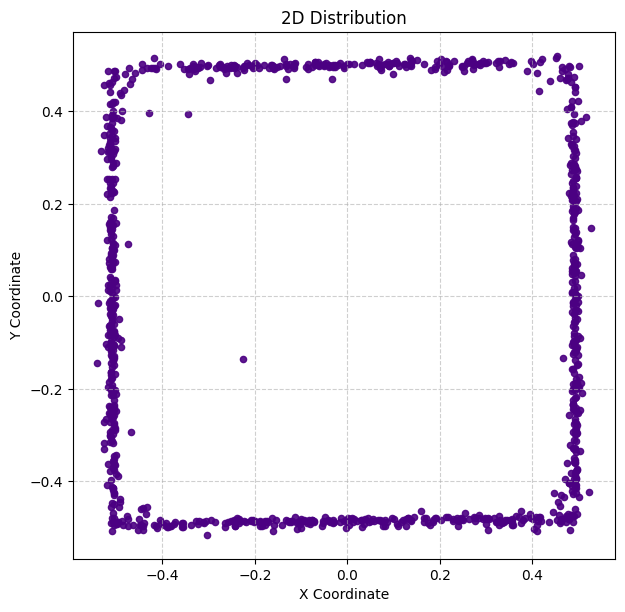

In [114]:
#run model on some points
test_x = [np.random.normal(0,2) for i in range(100)]
test_y = [np.random.normal(0,2) for i in range(100)]

ddim_data, _ = sample_ddim(model, 1000, alpha_bars, inference_steps=100, eta=0.0)
plot_points(ddim_data[:, 0], ddim_data[:, 1])

In [115]:
#visualize distribution
def plot_vector_field(x_values, y_values, dx_values, dy_values):
    """
    Plots the generated 2D points.
    """
    # Increased point size for clearer visibility of the sharp points
    plt.figure(figsize=(7, 7))
    for (x,y,dx,dy) in zip(x_values, y_values, dx_values, dy_values):
        plt.arrow(x,y,-dx/5,-dy/5, head_width=0.01, head_length=0.02, fc='blue', ec='blue')

    plt.title('2D Distribution')
    plt.xlabel('X Coordinate')
    plt.ylabel('Y Coordinate')
    plt.gca().set_aspect('equal', adjustable='box') # Ensure circle looks like a circle
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()

In [116]:
side_length = 20
vector_scale = 2
vector_x = [vector_scale*(x/(side_length-1) - 0.5) for x in range(side_length)] * side_length
vector_y = [vector_scale*(y/(side_length-1) - 0.5) for y in range(side_length) for i in range(side_length)]

history = vector_field_ddim(model, alpha_bars, 50, vector_x, vector_y)

DDIM Sampling with 50 steps...


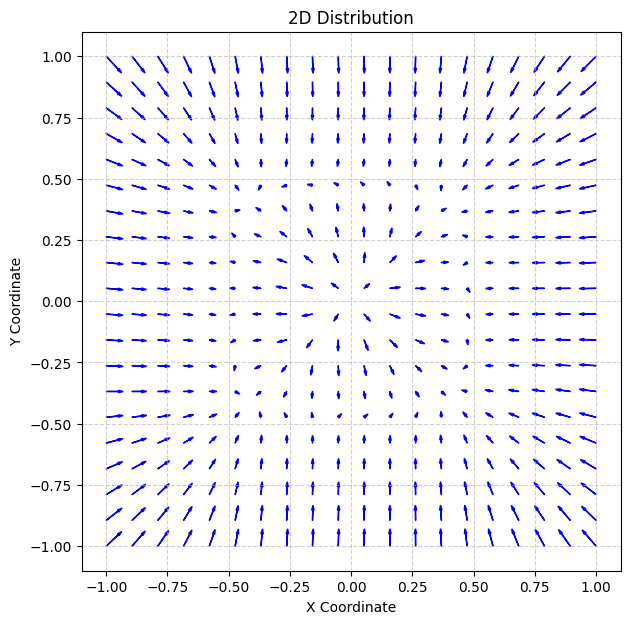

In [117]:
time_step = 47
plot_vector_field(vector_x, vector_y, history[time_step][:, 0], history[time_step][:, 1])

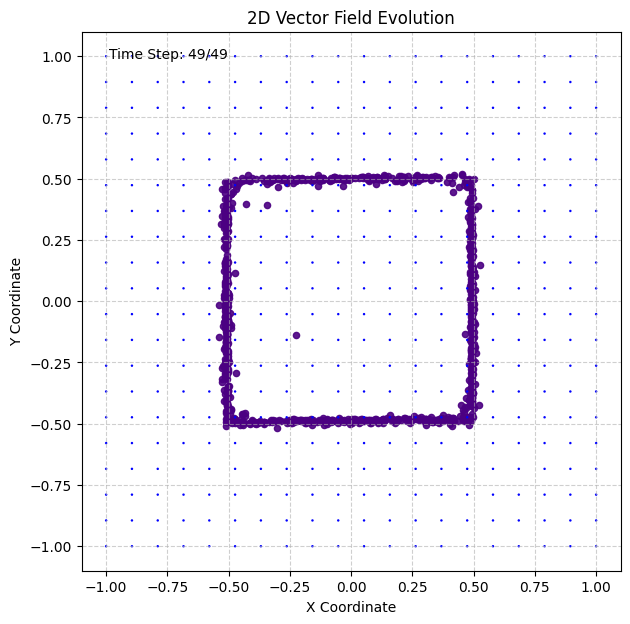

In [ ]:
#animation of the distribution
from matplotlib import animation
num_time_steps = 50

fig, ax = plt.subplots(figsize=(7, 7))
ax.set_title('2D Vector Field Evolution')
ax.set_xlabel('X Coordinate')
ax.set_ylabel('Y Coordinate')
ax.set_aspect('equal', adjustable='box')
ax.set_xlim(min(vector_x) * 1.1, max(vector_x) * 1.1)
ax.set_ylim(min(vector_y) * 1.1, max(vector_y) * 1.1)
ax.grid(True, linestyle='--', alpha=0.6)

#print an actual distribution
ax.scatter(ddim_data[:, 0], ddim_data[:, 1], s=20, alpha=0.9, color='indigo') 

scale_factor = 1 # This factor should match the /5 used in your original plot
Q = ax.quiver(
    vector_x,
    vector_y,
    -history[0][:, 0] / scale_factor, # Note the -dx and /scale_factor
    -history[0][:, 1] / scale_factor, # Note the -dy and /scale_factor
    color='blue',
    angles='xy',
    scale_units='xy',
    scale=2, # Sets scale=1 which means the vectors are plotted in data units
    width=0.005 # Width of the arrow shaft
)


# Initialize time text for display
time_text = ax.text(0.05, 0.95, '', transform=ax.transAxes)


# --- 3. Animation Update Function ---
def update(frame):
    """
    Updates the vector field for the given frame (time step).
    """
    # Get the dx, dy values for the current frame
    current_dx = history[frame][:, 0]
    current_dy = history[frame][:, 1]

    # Update the vectors in the quiver plot
    # The first two arguments are ignored when only the U and V arrays are passed
    # Remember the sign change and scaling from your original plot: -dx/5, -dy/5
    Q.set_UVC(-current_dx / scale_factor, -current_dy / scale_factor)

    # Update the time step text
    time_text.set_text(f'Time Step: {frame}/{num_time_steps - 1}')

    return Q, time_text # Return the objects that were modified


# --- 4. Create and Display the Animation ---
# 'frames' specifies the number of time steps to iterate over
anim = animation.FuncAnimation(
    fig,
    update,
    frames=num_time_steps,
    interval=50, # Delay between frames in ms
    blit=True,   # Optimizes drawing (only works if returning objects)
    repeat=True # Don't loop the animation
)

from IPython.display import HTML
HTML(anim.to_jshtml())